<a href="https://colab.research.google.com/github/pierreduke/CNN_DF_Saved/blob/main/spp2_xception_celeb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Kết nối Google Colab với Drive và cài đặt các thư viện cần thiết**

In [ ]:
from google.colab import drive
drive._mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install -U git+https://github.com/qubvel/efficientnet
! pip install tensorflow-addons
! pip install git+https://github.com/qubvel/classification_models.git

  Cloning https://github.com/qubvel/efficientnet to /tmp/pip-req-build-05kxglvi
  Running command git clone -q https://github.com/qubvel/efficientnet /tmp/pip-req-build-05kxglvi
     |████████████████████████████████| 50 kB 4.1 MB/s 
  Created wheel for efficientnet: filename=efficientnet-1.1.1-py3-none-any.whl size=18447 sha256=96b9d81ab562f7554ffbe326086b820c6ffac66ed4aa1ccbe51b1878d238e595
  Stored in directory: /tmp/pip-ephem-wheel-cache-15gyvjfg/wheels/11/69/85/814d64d694c96db0eef17b718042d644a1e54f113920481920
Successfully built efficientnet
     |████████████████████████████████| 1.1 MB 6.8 MB/s 
  Cloning https://github.com/qubvel/classification_models.git to /tmp/pip-req-build-mdwz0p7g
  Running command git clone -q https://github.com/qubvel/classification_models.git /tmp/pip-req-build-mdwz0p7g
  Running command git submodule update --init --recursive -q
  Created wheel for image-classifiers: filename=image_classifiers-1.0.0-py3-none-any.whl size=20045 sha256=2dd1503114181506d

**Giải nén tệp dữ liệu**

In [ ]:
# !unzip  /content/drive/MyDrive/DatasetFF_train.zip
!unzip  /content/drive/MyDrive/DatasetCELEB_train.zip
# !unzip /content/drive/MyDrive/DatasetMIX_train.zip

**1) Khai báo các thư viện sử dụng**

In [ ]:
import os
import keras.backend as K
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, InputSpec, Layer, BatchNormalization, Convolution2D
from tensorflow.keras.layers import AveragePooling2D, AveragePooling1D, MaxPooling2D, MaxPooling1D
from tensorflow_addons.layers import SpatialPyramidPooling2D



> **1.1) Đối với DenseNet121 và Xception**



In [ ]:
from classification_models.tfkeras import Classifiers
Xception, preprocess_input = Classifiers.get('xception')
get = Xception(
    weights = 'imagenet',
    input_shape = (224,224, 3),
    include_top = False,
)

model = Sequential()
model.add(get)
model.add(SpatialPyramidPooling2D([1, 2, 4]))
model.add(Flatten(name="flatten"))
model.add(Dense(units = 2, activation = 'softmax'))
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 7, 7, 2048)        20861480  
                                                                 
 spatial_pyramid_pooling2d_1  (None, 21, 2048)         0         
  (SpatialPyramidPooling2D)                                      
                                                                 
 flatten (Flatten)           (None, 43008)             0         
                                                                 
 dense_7 (Dense)             (None, 2)                 86018     
                                                                 
Total params: 20,947,498
Trainable params: 20,892,970
Non-trainable params: 54,528
_________________________________________________________________




> **1.2) Đối với EfficientNetB0 đến EfficientNetB2**



In [ ]:
# from efficientnet.tfkeras import EfficientNetB2 #EfficientNetB0, EfficientNetB1, EfficientNetB2
# efficient_net = EfficientNetB2(
#     weights = 'imagenet',
#     input_shape = (224, 224, 3),
#     include_top = False,
# )

# model = Sequential()
# model.add(efficient_net)
# model.add(SpatialPyramidPooling2D([1, 2, 4]))
# model.add(Flatten(name="flatten"))
# model.add(Dense(units = 512, activation = 'relu'))
# model.add(Dropout(0.5))
# model.add(Dense(units = 256, activation = 'relu'))
# model.add(Dense(units = 2, activation = 'softmax'))
# model.summary()

31948800/31936256 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b2 (Functional  (None, 7, 7, 1408)       7768562   
 )                                                               
                                                                 
 spatial_pyramid_pooling2d (  (None, 21, 1408)         0         
 SpatialPyramidPooling2D)                                        
                                                                 
 flatten (Flatten)           (None, 29568)             0         
                                                                 
 dense (Dense)               (None, 512)               15139328  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                         

In [ ]:
model.compile(optimizer = Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

**2) Khởi tạo đường dẫn, checkpoint và callbacks**

In [ ]:
train_path = '/content/DatasetCELEB_train/train'
val_path = '/content/DatasetCELEB_train/val'

In [ ]:
checkpoint_filepath = '/content/drive/MyDrive/model_checkpoint/'
print('Creating Directory: ' + checkpoint_filepath)
os.makedirs(checkpoint_filepath, exist_ok=True)

Creating Directory: /content/drive/MyDrive/model_checkpoint/


In [ ]:
custom_callbacks = [
    EarlyStopping(
        monitor = 'val_loss',
        mode = 'min',
        patience = 10,
        verbose = 1
    ),
    ModelCheckpoint(
        filepath = os.path.join(checkpoint_filepath, 'SPP2_Xception_CELEB.h5'),
        monitor = 'val_loss',
        mode = 'min',
        verbose = 1,
        save_best_only = True
    )
]

**3) ImageDataGenerator**

In [ ]:
train_datagen = ImageDataGenerator(
    rescale = 1/255,
    rotation_range = 10,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    shear_range = 0.2,
    zoom_range = 0.1,
    horizontal_flip = True,
    fill_mode = 'nearest'
)
train_generator = train_datagen.flow_from_directory(
    directory = train_path,
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True
)

val_datagen = ImageDataGenerator(
    rescale = 1/255    #rescale the tensor values to [0,1]
)
val_generator = val_datagen.flow_from_directory(
    directory = val_path,
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = "categorical",
    batch_size = 32,
    shuffle = True
)

Found 77703 images belonging to 2 classes.
Found 19426 images belonging to 2 classes.


In [ ]:
len(train_generator)

2429

**4) Huấn luyện**

In [ ]:
num_epochs = 20

In [ ]:
H = model.fit(
    train_generator,
    epochs = num_epochs,
    steps_per_epoch = len(train_generator),
    validation_data = val_generator,
    validation_steps = len(val_generator),
    callbacks = custom_callbacks
)
print(H.history)

Epoch 1/20
2429/2429 [==============================] - ETA: 0s - loss: 0.1207 - accuracy: 0.9522
Epoch 00001: val_loss improved from inf to 0.03316, saving model to /content/drive/MyDrive/model_checkpoint/SPP2_Xception_CELEB.h5


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


2429/2429 [==============================] - 998s 405ms/step - loss: 0.1207 - accuracy: 0.9522 - val_loss: 0.0332 - val_accuracy: 0.9872
Epoch 2/20
2429/2429 [==============================] - ETA: 0s - loss: 0.0371 - accuracy: 0.9869
Epoch 00002: val_loss improved from 0.03316 to 0.01811, saving model to /content/drive/MyDrive/model_checkpoint/SPP2_Xception_CELEB.h5
2429/2429 [==============================] - 982s 404ms/step - loss: 0.0371 - accuracy: 0.9869 - val_loss: 0.0181 - val_accuracy: 0.9943
Epoch 3/20
2429/2429 [==============================] - ETA: 0s - loss: 0.0255 - accuracy: 0.9910
Epoch 00003: val_loss did not improve from 0.01811
2429/2429 [==============================] - 976s 402ms/step - loss: 0.0255 - accuracy: 0.9910 - val_loss: 0.0293 - val_accuracy: 0.9891
Epoch 4/20
2429/2429 [==============================] - ETA: 0s - loss: 0.0185 - accuracy: 0.9938
Epoch 00004: val_loss improved from 0.01811 to 0.01090, saving model to /content/drive/MyDrive/model_checkpoi

**5) Plot đồ thị train**

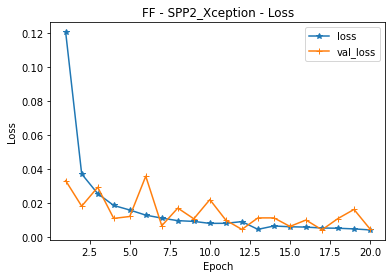

In [ ]:
import matplotlib.pyplot as plt
acc = H.history['accuracy']
val_acc = H.history['val_accuracy']
loss = H.history['loss']
val_loss = H.history['val_loss']

import matplotlib.pyplot as plt
epochs = range(1, len(acc) + 1)
plt.plot(epochs, H.history['loss'], label='loss', marker="*")
plt.plot(epochs, H.history['val_loss'], label='val_loss', marker="+")
plt.xlabel('Epoch')
plt.ylabel('Loss')
# plt.ylim([0,1])
plt.title('FF - SPP2_Xception - Loss')
plt.legend()
plt.show()

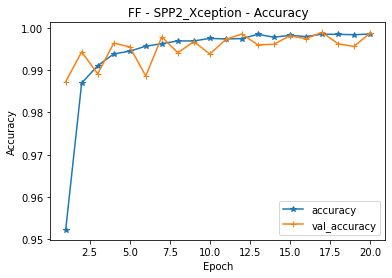

In [ ]:
plt.plot(epochs, H.history['accuracy'], label='accuracy', marker="*")
plt.plot(epochs, H.history['val_accuracy'], label='val_accuracy', marker="+")
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
# plt.ylim([0,1])
plt.title('FF - SPP2_Xception - Accuracy')
plt.legend()
plt.show()

**Continue_training**

In [ ]:
new_custom_callbacks = [
    EarlyStopping(
        monitor = 'val_loss',
        mode = 'min',
        patience = 6,
        verbose = 1
    ),
    ModelCheckpoint(
        filepath = os.path.join(checkpoint_filepath, 'SPP2_Xception_FF_part2.h5'),
        monitor = 'val_loss',
        mode = 'min',
        verbose = 1,
        save_best_only = True
    )
]

In [ ]:
H = new_model.fit_generator(
    train_generator,
    epochs = num_epochs,
    steps_per_epoch = len(train_generator),
    validation_data = val_generator,
    validation_steps = len(val_generator),
    callbacks = new_custom_callbacks
)
print(H.history)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  import sys


Epoch 1/20
2162/2162 [==============================] - ETA: 0s - loss: 0.0293 - accuracy: 0.9892
Epoch 00001: val_loss improved from inf to 0.05243, saving model to /content/drive/MyDrive/model_checkpoint/SPP2_EfficientNetB2_FF_added_part2.h5


/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


2162/2162 [==============================] - 878s 402ms/step - loss: 0.0293 - accuracy: 0.9892 - val_loss: 0.0524 - val_accuracy: 0.9796
Epoch 2/20
2162/2162 [==============================] - ETA: 0s - loss: 0.0258 - accuracy: 0.9898
Epoch 00002: val_loss did not improve from 0.05243
2162/2162 [==============================] - 849s 393ms/step - loss: 0.0258 - accuracy: 0.9898 - val_loss: 0.0658 - val_accuracy: 0.9770
Epoch 3/20
2162/2162 [==============================] - ETA: 0s - loss: 0.0239 - accuracy: 0.9906
Epoch 00003: val_loss did not improve from 0.05243
2162/2162 [==============================] - 854s 395ms/step - loss: 0.0239 - accuracy: 0.9906 - val_loss: 0.0534 - val_accuracy: 0.9822
Epoch 4/20
2162/2162 [==============================] - ETA: 0s - loss: 0.0254 - accuracy: 0.9905
Epoch 00004: val_loss improved from 0.05243 to 0.04518, saving model to /content/drive/MyDrive/model_checkpoint/SPP2_EfficientNetB2_FF_added_part2.h5
2162/2162 [==============================] 



---



---



---



---



---



---
**Phần test**


---

---



---



---



---






In [ ]:
# !unzip /content/drive/MyDrive/DatasetFF_test.zip
!unzip /content/drive/MyDrive/DatasetCELEB_test.zip

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  inflating: DatasetCELEB_test/real/5450.jpg  
  inflating: DatasetCELEB_test/real/5451.jpg  
  inflating: DatasetCELEB_test/real/5452.jpg  
  inflating: DatasetCELEB_test/real/5453.jpg  
  inflating: DatasetCELEB_test/real/5454.jpg  
  inflating: DatasetCELEB_test/real/5455.jpg  
  inflating: DatasetCELEB_test/real/5456.jpg  
  inflating: DatasetCELEB_test/real/5457.jpg  
  inflating: DatasetCELEB_test/real/5458.jpg  
  inflating: DatasetCELEB_test/real/5459.jpg  
  inflating: DatasetCELEB_test/real/546.jpg  
  inflating: DatasetCELEB_test/real/5460.jpg  
  inflating: DatasetCELEB_test/real/5461.jpg  
  inflating: DatasetCELEB_test/real/5462.jpg  
  inflating: DatasetCELEB_test/real/5463.jpg  
  inflating: DatasetCELEB_test/real/5464.jpg  
  inflating: DatasetCELEB_test/real/5465.jpg  
  inflating: DatasetCELEB_test/real/5466.jpg  
  inflating: DatasetCELEB_test/real/5467.jpg  
  inflating: DatasetCELEB_test/real/5468.jpg  
  in

**1) Khai báo thư viện**

In [ ]:
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

**2) Khai báo tệp test**

In [ ]:
test_path = '/content/DatasetCELEB_test'
test_datagen = ImageDataGenerator(
    rescale = 1/255    #rescale the tensor values to [0,1]
)

test_generator = test_datagen.flow_from_directory(
    directory = test_path,
    classes=['real', 'fake'],
    target_size = (224,224),
    color_mode = "rgb",
    class_mode = None,
    batch_size = 1,
    shuffle = False
)

Found 33384 images belonging to 2 classes.


**3) Load mô hình đã học ở trên**

In [ ]:
new_model = load_model('/content/drive/MyDrive/model_checkpoint/SPP2_Xception_FF_part2.h5',
                       custom_objects={'SpatialPyramidPooling2D': SpatialPyramidPooling2D})

OSError: ignored

**4) Predict tệp dataset**

In [ ]:
test_generator.reset()
preds = new_model.predict(test_generator, verbose = 1)

33384/33384 [==============================] - 459s 14ms/step


In [ ]:
print(preds)

[[1.6794236e-17 1.0000000e+00]
 [2.2943636e-08 1.0000000e+00]
 [7.9731373e-27 1.0000000e+00]
 ...
 [1.0000000e+00 6.5872478e-15]
 [1.0000000e+00 1.0531305e-08]
 [9.9999726e-01 2.6926612e-06]]


**5) Encoder True Labels (Nên kiểm tra nhãn trước, [0 1] thì set 'real, fake'**

In [ ]:
from keras.utils import np_utils
from imutils import paths
import numpy as np
import pickle
from sklearn.preprocessing import LabelEncoder
import os

path_reals = list(paths.list_images('/content/DatasetCELEB_test/real'))
labels_real = []

for path_real in path_reals:
	label2 = path_real.split(os.path.sep)[-2]
	labels_real.append(label2)
 
path_fakes = list(paths.list_images('/content/DatasetCELEB_test/fake'))
labels_fake = []

for path_fake in path_fakes:
	label3 = path_fake.split(os.path.sep)[-2]
	labels_fake.append(label3)
 
labels_test = labels_real + labels_fake

In [ ]:
print(labels_test[2])
print(labels_test[30000])

real
fake


In [ ]:
le = LabelEncoder()
labels_test = le.fit_transform(labels_test)
labels_test = np_utils.to_categorical(labels_test, 2)

f = open('le.pickle', "wb")
f.write(pickle.dumps(le))
f.close()

In [ ]:
print(labels_test[2])
print(labels_test[30000])

[0. 1.]
[1. 0.]


**6) Classification Report**

In [ ]:
from sklearn.metrics import classification_report

test = np.argmin(labels_test, axis=1)
pred = np.argmin(preds, axis=1)
print(classification_report(test, pred, target_names=le.classes_, digits = 5))

              precision    recall  f1-score   support

        fake    0.99710   0.94664   0.97121     17428
        real    0.94477   0.99699   0.97018     15956

    accuracy                        0.97070     33384
   macro avg    0.97093   0.97181   0.97070     33384
weighted avg    0.97209   0.97070   0.97072     33384



In [ ]:
print(test)
print(pred)

[0 0 0 ... 1 1 1]
[0 0 0 ... 1 1 1]


**7) Confussion Matrix**

[[16498   930]
 [   48 15908]]


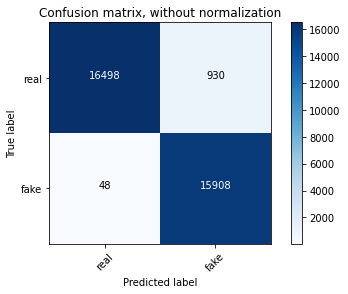

In [ ]:
from sklearn.metrics import confusion_matrix
cnf_matrix = confusion_matrix(test, pred)
print(cnf_matrix)
import matplotlib.pyplot as plt
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1, keepdims = True)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.5f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
  
class_names = ['real', 'fake']
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix, without normalization')
plt.show()

**8) EER, TPR, FPR**

In [ ]:
from sklearn.metrics import auc, roc_curve
fpr, tpr, _ = roc_curve(test, pred, pos_label=1)

fnr = 1 - tpr
fpr_eer = fpr[np.nanargmin(np.absolute((fnr - fpr)))]
fnr_eer = fnr[np.nanargmin(np.absolute((fnr - fpr)))]
eer = min(fpr_eer, fnr_eer)
print("tpr = ", tpr)
print("fpr = ", fpr)
print("eer = ", eer)

tpr =  [0.         0.99699173 1.        ]
fpr =  [0.         0.05336241 1.        ]
eer =  0.003008272750062657


**9) Đồ thị ROC**

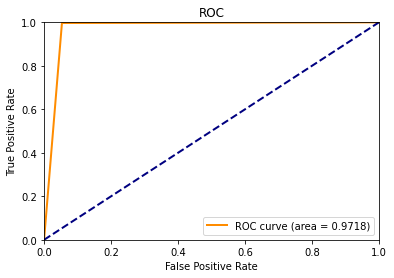

In [ ]:
import matplotlib.pyplot as plt
from itertools import cycle
plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.4f)' % auc(fpr, tpr))
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

**10) Test trên 1 tệp ảnh riêng**







> 10.1) Face Dectector using cv2.dnn



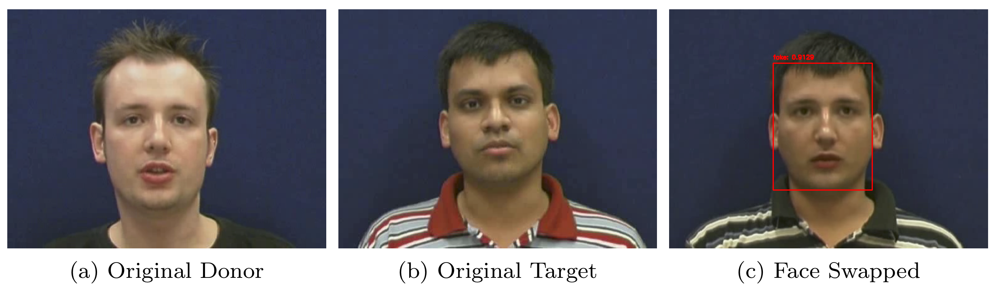

[0.9129481  0.08705195]




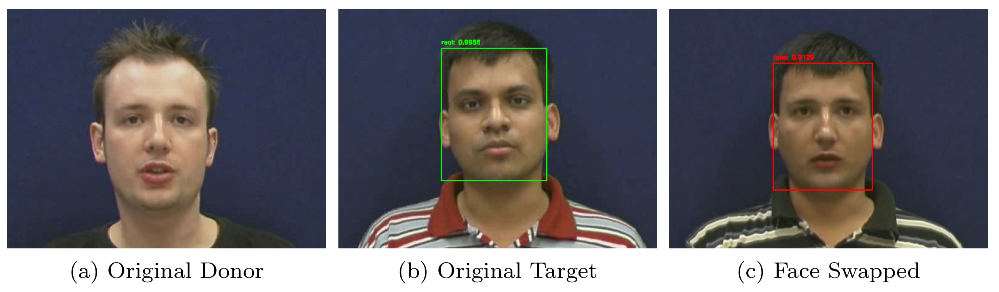

[0.00141921 0.9985808 ]




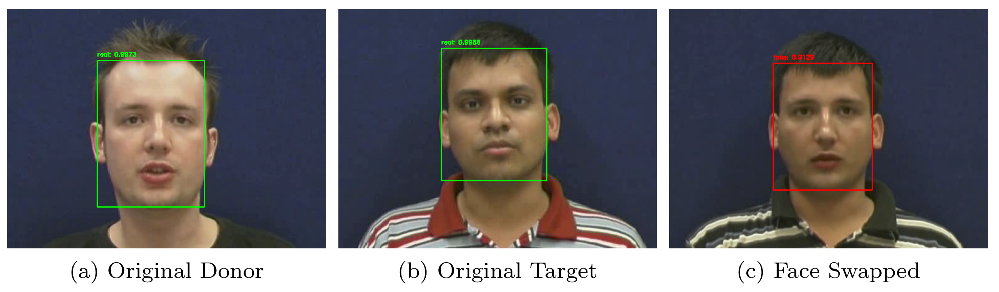

[0.00271462 0.99728537]




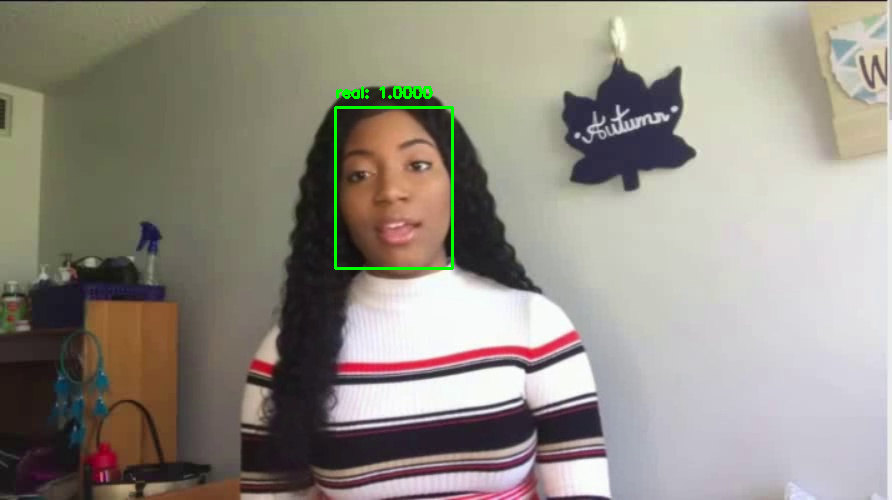

[1.2867977e-06 9.9999869e-01]




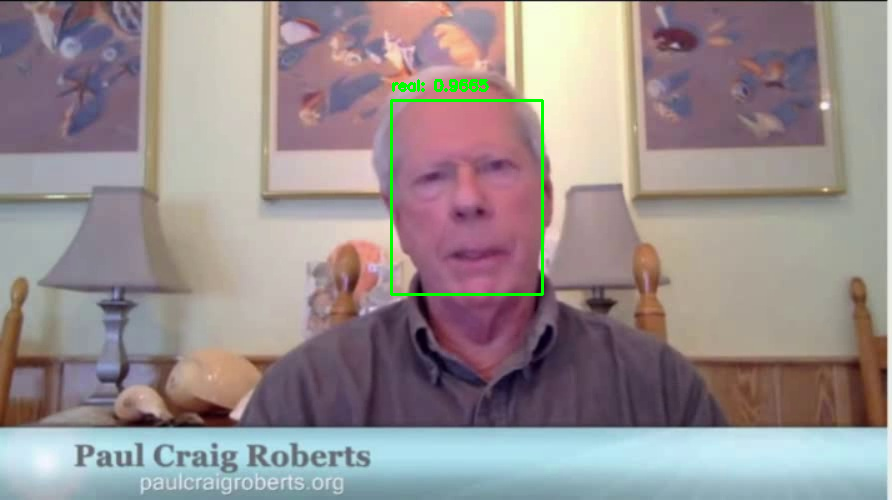

[0.03354948 0.9664505 ]




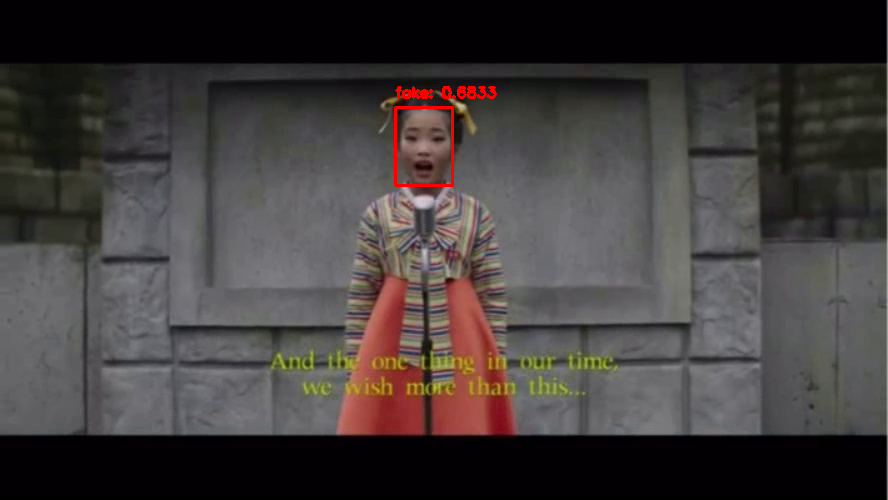

[0.6832755 0.3167245]




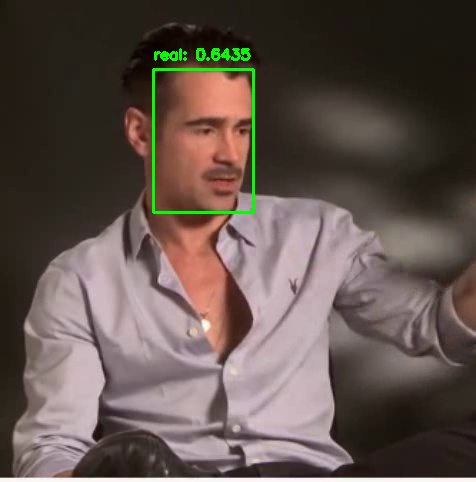

[0.35649458 0.6435054 ]




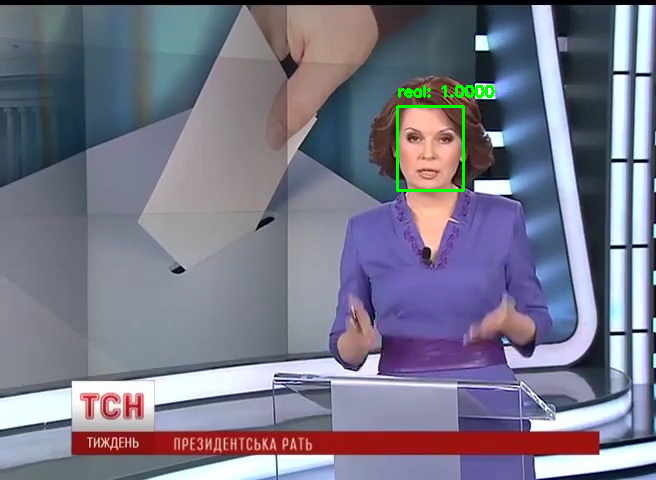

[2.965864e-06 9.999970e-01]




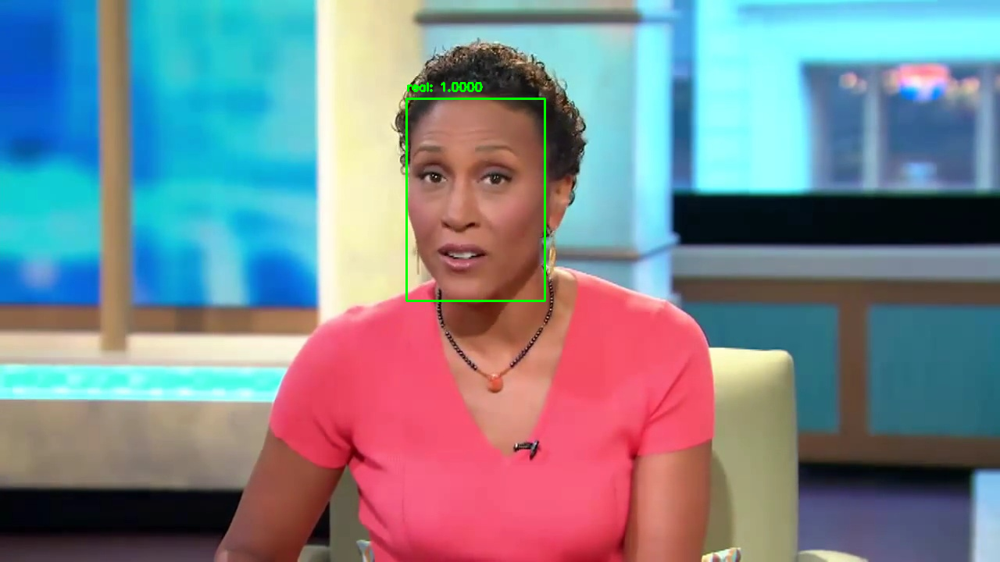

[1.1184144e-07 9.9999988e-01]




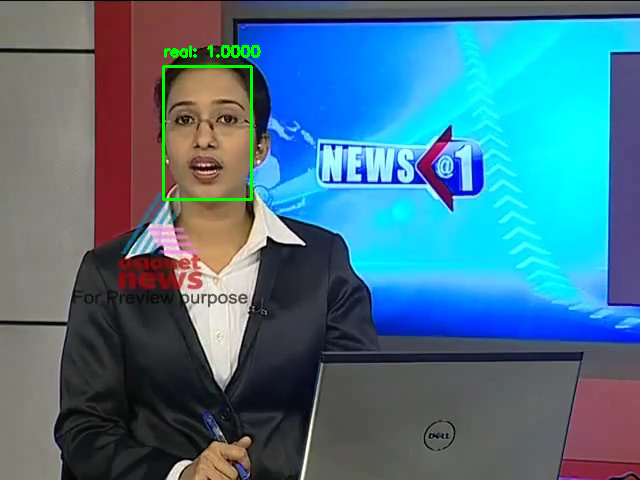

[1.3672537e-17 1.0000000e+00]




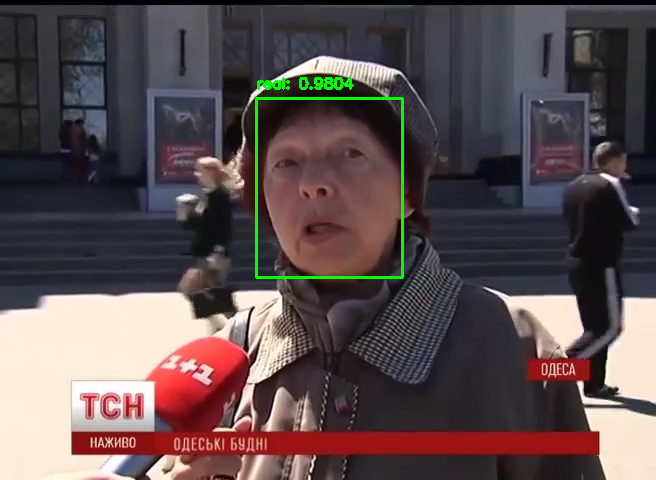

[0.01959999 0.98039997]




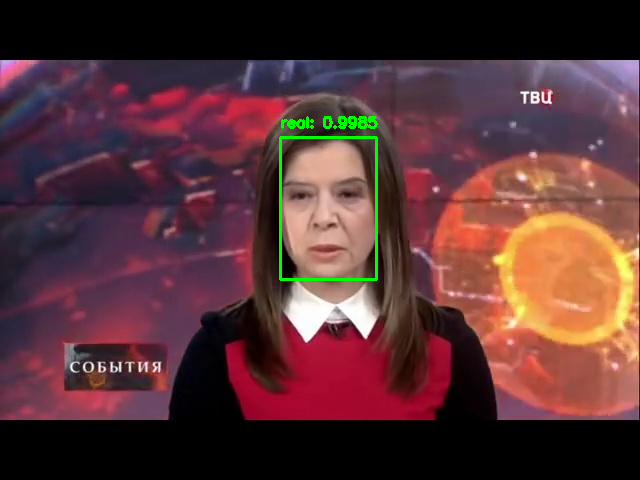

[0.00147924 0.9985208 ]




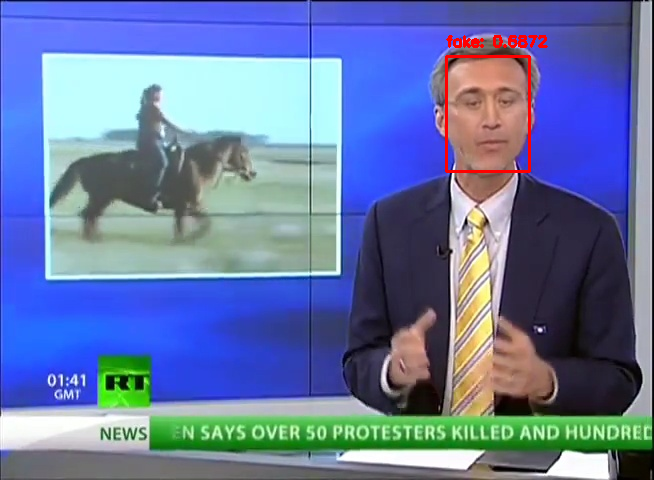

[0.6871818  0.31281817]




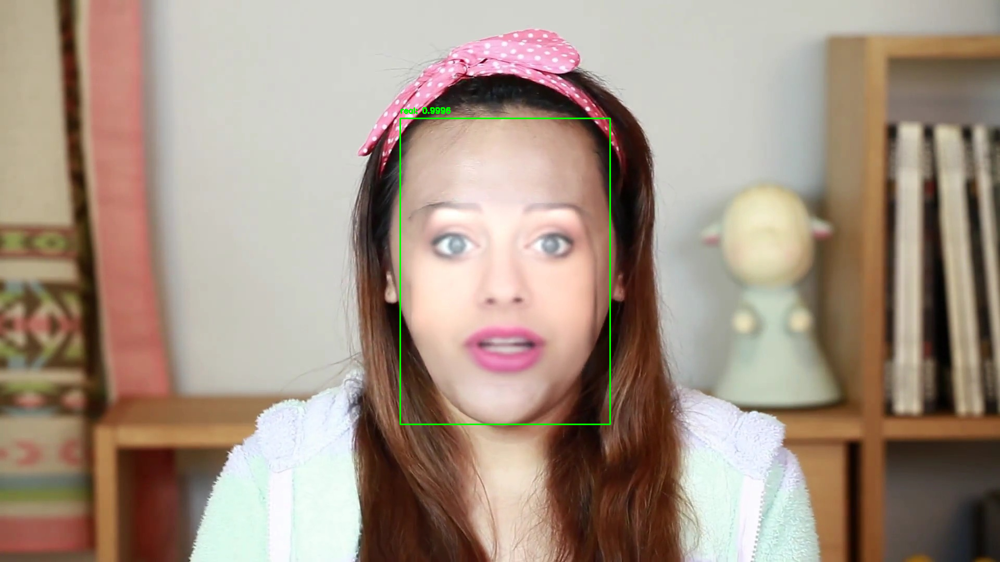

[3.889383e-04 9.996111e-01]




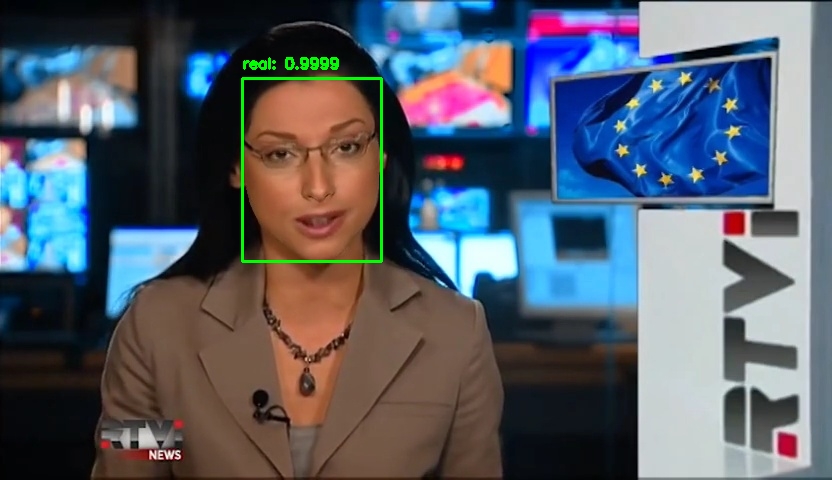

[6.388614e-05 9.999361e-01]




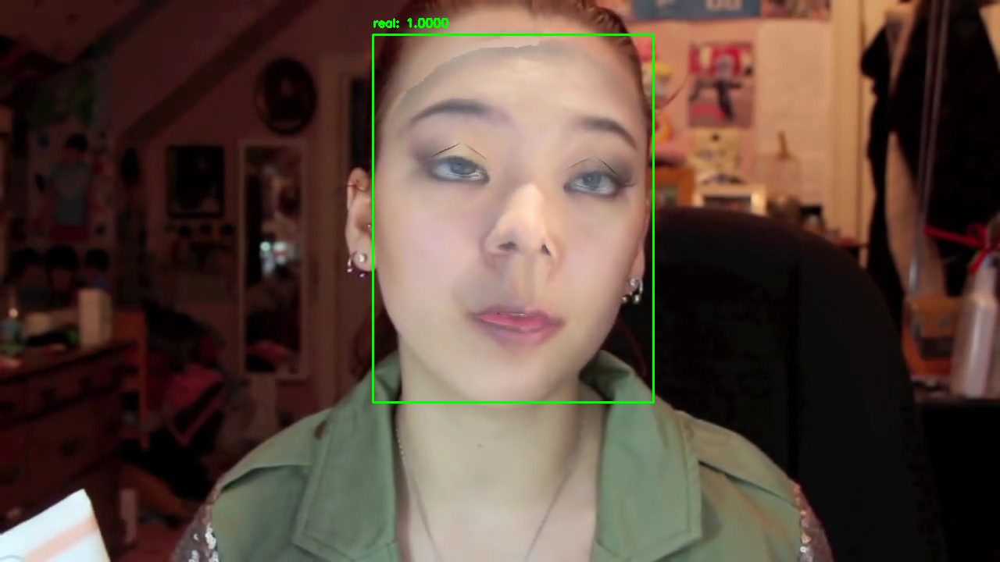

[5.6468605e-07 9.9999940e-01]




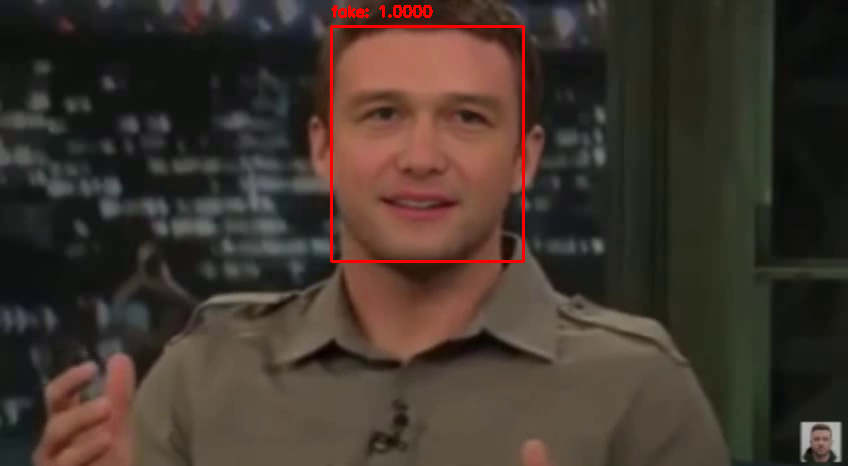

[9.9999964e-01 3.0314442e-07]




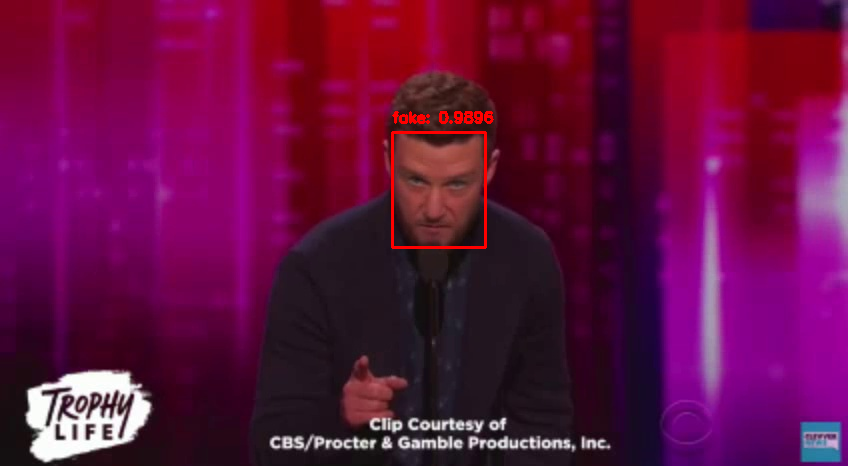

[0.9896281  0.01037199]




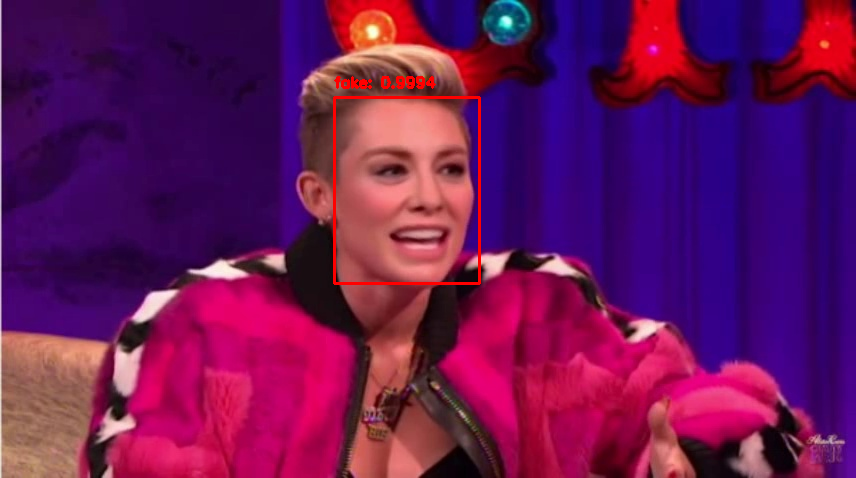

[9.9944586e-01 5.5412727e-04]




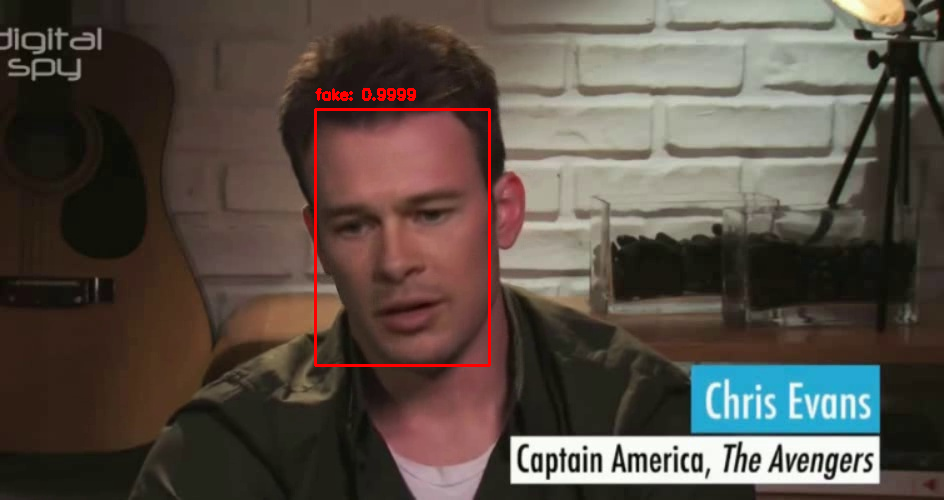

[9.9994552e-01 5.4528406e-05]




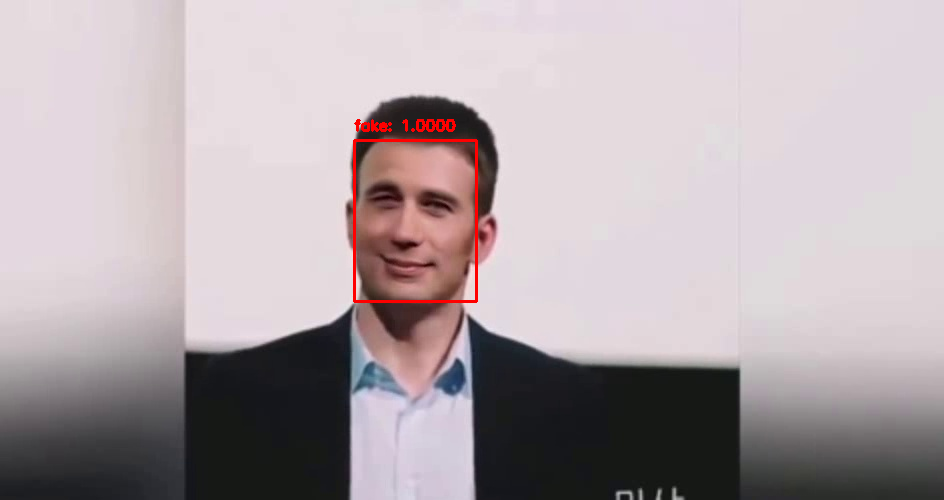

[9.9995160e-01 4.8364644e-05]




In [ ]:
import cv2
import glob
from keras.preprocessing.image import img_to_array
from google.colab.patches import cv2_imshow
import pickle
import numpy as np

net = cv2.dnn.readNetFromCaffe('/content/drive/MyDrive/deploy.prototxt',
                               '/content/drive/MyDrive/res10_300x300_ssd_iter_140000.caffemodel')
folder = glob.glob('/content/drive/MyDrive/test_img/*.*')
for file in folder:
  frame = cv2.imread(file)
  (h, w) = frame.shape[:2]
  le = pickle.loads(open('/content/le.pickle', "rb").read())
  blob = cv2.dnn.blobFromImage(cv2.resize(frame, (300, 300)), 1.0, (300, 300), (104.0, 177.0, 123.0))
  # Phat hien khuon mat
  net.setInput(blob)
  detections = net.forward()

  # Loop qua cac khuon mat
  for i in range(0, detections.shape[2]):
    confidence = detections[0, 0, i, 2]

    # Neu conf lon hon threshold
    if confidence > 0.5:
      box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
      (startX, startY, endX, endY) = box.astype("int")
      startX = max(0, startX)
      startY = max(0, startY)
      endX = min(w, endX)
      endY = min(h, endY)

      # Lay vung khuon mat
      face = frame[startY:endY, startX:endX]
      try:
        face = cv2.resize(face, (224,224))
      except Exception as e:
        continue
      face = face.astype("float") / 255.0
      face = img_to_array(face)
      face = np.expand_dims(face, axis=0)

      # Dua vao model de nhan dien fake/real
      face_preds = new_model.predict(face)[0]
      j = np.argmax(face_preds)
      label = le.classes_[j]

      # Ve hinh chu nhat quanh mat
      label = "{}: {:.4f}".format(label, face_preds[j])
      if (j==0):
        # Neu la fake thi ve mau do
        cv2.putText(frame, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
        cv2.rectangle(frame, (startX, startY), (endX, endY), (0, 0, 255), 2)
      else:
        # Neu real thi ve mau xanh
        cv2.putText(frame, label, (startX, startY - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.rectangle(frame, (startX, startY), (endX, endY), (0,  255,0), 2)
      cv2_imshow(frame)
      print(face_preds)
      print('\n')


In [ ]:
test = np.argmin(labels_test, axis=1)
true = preds[:, 0]
print(true)

[1.6794236e-17 2.2943636e-08 7.9731373e-27 ... 1.0000000e+00 1.0000000e+00
 9.9999726e-01]


threshold at eer =  0.98395824
eer =  0.014861142988294699


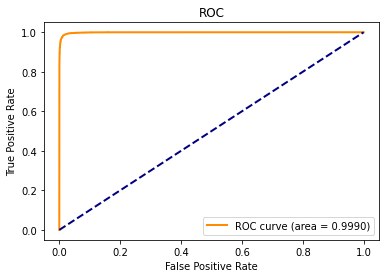

In [ ]:
from sklearn.metrics import auc, roc_curve
import matplotlib.pyplot as plt
from itertools import cycle

fpr, tpr, threshold = roc_curve(test, true, pos_label=1)
fnr = 1 - tpr
fpr_eer = fpr[np.nanargmin(np.absolute((fnr - fpr)))]
fnr_eer = fnr[np.nanargmin(np.absolute((fnr - fpr)))]
eer_threshold = threshold[np.nanargmin(np.absolute((fnr - fpr)))]
eer = min(fpr_eer, fnr_eer)
print("threshold at eer = ", eer_threshold)
print("eer = ", eer)

plt.figure()
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.4f)' % auc(fpr, tpr))
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC')
plt.legend(loc="lower right")
plt.show()

In [ ]:
import numpy as np

from scipy import interpolate

import matplotlib.pyplot as plt

from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score


def cal_metric(groundTruth, predicted):
    fpr, tpr, thresholds = roc_curve(groundTruth, predicted)
    y = (tpr)
    x = (fpr)
    z = tpr + fpr
    tpr = tpr.reshape((tpr.shape[0], 1))
    fpr = fpr.reshape((fpr.shape[0], 1))
    xnew = np.arange(0, 1, 0.0000001)
    func = interpolate.interp1d(x, y)
    # frr = fpr
    ynew = func(xnew)

    znew = abs(xnew + ynew - 1)

    eer = xnew[np.argmin(znew)]
    print('EER =', eer)
    # interpolate thresholds
    func_2 = interpolate.interp1d(x, thresholds)
    thresholds_new = func_2(xnew)

    print("Threshold at eer: {}".format(thresholds_new[np.argmin(znew)]))

    FPR = {"TPR(1.%)": 0.01, "TPR(.5%)": 0.005}

    TPRs = {"TPR(1.%)": 0.01, "TPR(.5%)": 0.005}

    for i, (key, value) in enumerate(FPR.items()):
        index = np.argwhere(xnew == value)

        score = ynew[index]

        TPRs[key] = float(np.squeeze(score))
    #	    print(key, score)

    auc = roc_auc_score(groundTruth, predicted)
    print('AUC = ', auc)
    print ('TPRs = ', TPRs)
    if 1:
        plt.plot(xnew, ynew)
        plt.title("ROC curve")
        plt.xlabel("FPR")
        plt.ylabel("TPR")
        plt.show()

    return eer, TPRs, auc, {'x': xnew, 'y': ynew}

EER = 0.014770499999999999


/usr/local/lib/python3.7/dist-packages/scipy/interpolate/interpolate.py:609: RuntimeWarning: divide by zero encountered in true_divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]
/usr/local/lib/python3.7/dist-packages/scipy/interpolate/interpolate.py:612: RuntimeWarning: invalid value encountered in multiply
  y_new = slope*(x_new - x_lo)[:, None] + y_lo


Threshold at eer: 0.9840226568925892
AUC =  0.998971343503563
TPRs =  {'TPR(1.%)': 0.9762471797442969, 'TPR(.5%)': 0.9593256455251943}


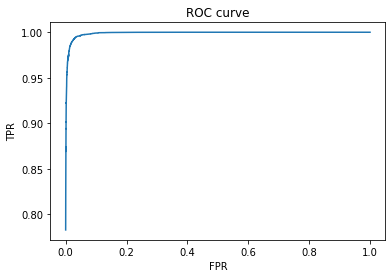

(0.014770499999999999,
 {'TPR(.5%)': 0.9593256455251943, 'TPR(1.%)': 0.9762471797442969},
 0.998971343503563,
 {'x': array([0.000000e+00, 1.000000e-07, 2.000000e-07, ..., 9.999997e-01,
         9.999998e-01, 9.999999e-01]),
  'y': array([0.78290298, 0.78290943, 0.78291587, ..., 1.        , 1.        ,
         1.        ])})

In [ ]:
cal_metric(test, true)

In [ ]:
from sklearn.metrics import auc, roc_curve
FPR, TPR, THRESHOLD = roc_curve(test, pred, pos_label=1)

FNR = 1 - TPR
FPR_EER = FPR[np.nanargmin(np.absolute((FNR - FPR)))]
FNR_EER = FNR[np.nanargmin(np.absolute((FNR - FPR)))]
EER_THRESHOLD = THRESHOLD[np.nanargmin(np.absolute((FNR - FPR)))]
EER = min(FPR_EER, FNR_EER)
print("TPR = ", TPR)
print("EER_THRESHOLD = ", EER_THRESHOLD)
print("FPR = ", FPR)
print("EER = ", EER)

TPR =  [0.         0.99699173 1.        ]
EER_THRESHOLD =  1
FPR =  [0.         0.05336241 1.        ]
EER =  0.003008272750062657
